# Mapping LA Traffic Accidents

In [1]:
#We'll start by importing the libraries we need
# for data wrangling
import pandas as pd

# for interactive plots
import plotly.express as px

# to import open data
from sodapy import Socrata

In [2]:
# make sure to install these packages before running:
# pip install pandas
# pip install sodapy

import pandas as pd
from sodapy import Socrata

# Unauthenticated client only works with public data sets. Note 'None'
# in place of application token, and no username or password:
client = Socrata("data.lacity.org", None)

# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results = client.get("d5tf-ez2w", limit=2000)

# Convert to pandas DataFrame
collisions = pd.DataFrame.from_records(results)

# print it with .sample, which gives you random rows
collisions.sample(2)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,mocodes,...,premis_desc,location,cross_street,location_1,:@computed_region_qz3q_ghft,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,:@computed_region_ur2y_g4cx,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s
1806,191113760,2019-07-19T00:00:00.000,2019-07-19T00:00:00.000,0955,11,Northeast,1142,997,TRAFFIC COLLISION,3101 3401 3701 3008 3026,...,STREET,HILLHURST AV,AMBROSE AV,"{'latitude': '34.11', 'longitude': '-118.2874'...",23445,400,511,NaN,7,3
764,181106721,2018-03-02T00:00:00.000,2018-03-02T00:00:00.000,2025,11,Northeast,1149,997,TRAFFIC COLLISION,3101 3401 3701 3003 3024 3602,...,STREET,FIGUEROA ST,AVENUE 54,"{'latitude': '34.1076', 'longitude': '-118.196...",23673,374,588,28,11,93


In [3]:
# Convert to pandas DataFrame
collisions = pd.DataFrame.from_records(results)

### Data Exploration and Analysis

In [4]:
# how many rows and columns?
collisions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 24 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   dr_no                        2000 non-null   object
 1   date_rptd                    2000 non-null   object
 2   date_occ                     2000 non-null   object
 3   time_occ                     2000 non-null   object
 4   area                         2000 non-null   object
 5   area_name                    2000 non-null   object
 6   rpt_dist_no                  2000 non-null   object
 7   crm_cd                       2000 non-null   object
 8   crm_cd_desc                  2000 non-null   object
 9   mocodes                      1947 non-null   object
 10  vict_age                     1879 non-null   object
 11  vict_sex                     1958 non-null   object
 12  vict_descent                 1947 non-null   object
 13  premis_cd                    1958

In [5]:
# what fields and datatypes?
results = collisions.dtypes

print(results)

dr_no                          object
date_rptd                      object
date_occ                       object
time_occ                       object
area                           object
area_name                      object
rpt_dist_no                    object
crm_cd                         object
crm_cd_desc                    object
mocodes                        object
vict_age                       object
vict_sex                       object
vict_descent                   object
premis_cd                      object
premis_desc                    object
location                       object
cross_street                   object
location_1                     object
:@computed_region_qz3q_ghft    object
:@computed_region_k96s_3jcv    object
:@computed_region_tatf_ua23    object
:@computed_region_ur2y_g4cx    object
:@computed_region_kqwf_mjcx    object
:@computed_region_2dna_qi2s    object
dtype: object


In [6]:
# what are the first 5 rows?
collisions.head(5)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,mocodes,...,premis_desc,location,cross_street,location_1,:@computed_region_qz3q_ghft,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,:@computed_region_ur2y_g4cx,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s
0,190319651,2019-08-24T00:00:00.000,2019-08-24T00:00:00.000,0450,03,Southwest,0356,997,TRAFFIC COLLISION,3036 3004 3026 3101 4003,...,STREET,JEFFERSON BL,NORMANDIE AV,"{'latitude': '34.0255', 'longitude': '-118.300...",22724,691,916,7,14,32
1,190319680,2019-08-30T00:00:00.000,2019-08-30T00:00:00.000,2320,03,Southwest,0355,997,TRAFFIC COLLISION,3037 3006 3028 3030 3039 3101 4003,...,STREET,JEFFERSON BL,W WESTERN,"{'latitude': '34.0256', 'longitude': '-118.308...",23079,686,919,7,12,19
2,190413769,2019-08-25T00:00:00.000,2019-08-25T00:00:00.000,0545,04,Hollenbeck,0422,997,TRAFFIC COLLISION,3101 3401 3701 3006 3030,...,STREET,N BROADWAY,W EASTLAKE AV,"{'latitude': '34.0738', 'longitude': '-118.207...",23448,488,516,NaN,11,1
3,190127578,2019-11-20T00:00:00.000,2019-11-20T00:00:00.000,0350,01,Central,0128,997,TRAFFIC COLLISION,0605 3101 3401 3701 3011 3034,...,STREET,1ST,CENTRAL,"{'latitude': '34.0492', 'longitude': '-118.239...",22728,536,1502,NaN,9,28
4,190319695,2019-08-30T00:00:00.000,2019-08-30T00:00:00.000,2100,03,Southwest,0374,997,TRAFFIC COLLISION,0605 4025 3037 3004 3025 3101,...,STREET,MARTIN LUTHER KING JR,ARLINGTON AV,"{'latitude': '34.0108', 'longitude': '-118.318...",22725,747,1017,7,14,35


### Looking at 2022 Traffic Collisions

In [7]:
#only look at traffic collisions from January 2022 to December 2022
year_results = client.get("d5tf-ez2w", 
                     limit = 50000, # putting an arbitrary high number (otherwise defaults to 1000)
                     where = "date_occ between '2022-01-01T00:00:00' and '2022-12-31T00:00:00'"
                    )

In [8]:
# Convert to pandas DataFrame
lastyear_collisions = pd.DataFrame.from_records(year_results)

In [9]:
#check the data
# how many rows and columns?
lastyear_collisions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16354 entries, 0 to 16353
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   dr_no         16354 non-null  object
 1   date_rptd     16354 non-null  object
 2   date_occ      16354 non-null  object
 3   time_occ      16354 non-null  object
 4   area          16354 non-null  object
 5   area_name     16354 non-null  object
 6   rpt_dist_no   16354 non-null  object
 7   crm_cd        16354 non-null  object
 8   crm_cd_desc   16354 non-null  object
 9   mocodes       16226 non-null  object
 10  vict_age      14826 non-null  object
 11  vict_sex      16043 non-null  object
 12  vict_descent  16026 non-null  object
 13  premis_cd     16354 non-null  object
 14  premis_desc   16354 non-null  object
 15  location      16354 non-null  object
 16  cross_street  15691 non-null  object
 17  location_1    16354 non-null  object
dtypes: object(18)
memory usage: 2.2+ MB


In [10]:
lastyear_collisions.tail(5)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,mocodes,vict_age,vict_sex,vict_descent,premis_cd,premis_desc,location,cross_street,location_1
16349,231204524,2023-01-10T00:00:00.000,2022-12-31T00:00:00.000,1521,12,77th Street,1269,997,TRAFFIC COLLISION,4025 3004 3028 3030,37,M,H,101,STREET,300 E MANCHESTER AV,NaN,"{'latitude': '33.9638', 'longitude': '-118.262..."
16350,230204688,2022-12-31T00:00:00.000,2022-12-31T00:00:00.000,1240,02,Rampart,0218,997,TRAFFIC COLLISION,0605 3030 4024,35,M,O,101,STREET,1500 W SUNSET BL,NaN,"{'latitude': '34.0758', 'longitude': '-118.255..."
16351,230904001,2023-01-01T00:00:00.000,2022-12-31T00:00:00.000,2225,09,Van Nuys,0964,997,TRAFFIC COLLISION,3038 3602 3101 3004 3026 4026 3029 3037,58,M,W,101,STREET,WOODMAN AV,ADDISON ST,"{'latitude': '34.1612', 'longitude': '-118.431..."
16352,222019939,2022-12-31T00:00:00.000,2022-12-31T00:00:00.000,1240,20,Olympic,2076,997,TRAFFIC COLLISION,3006 3028 3030 4027 3034 3037 3101 3401 3701,22,NaN,NaN,101,STREET,VERMONT AV,WASHINGTON BL,"{'latitude': '34.04', 'longitude': '-118.2916'..."
16353,230106871,2022-12-31T00:00:00.000,2022-12-31T00:00:00.000,1225,01,Central,0162,997,TRAFFIC COLLISION,0605 3030 4024,47,M,W,101,STREET,W 8TH ST,S OLIVE ST,"{'latitude': '34.0452', 'longitude': '-118.256..."


## Data cleanup (asssisted by Yoh)

Here we split the data in location_1 column that is in a json (dictionary) format into separate columns for latitude and longitude.

This allows the map further below to work!

In [11]:
# create latitudue/longitude columns
lastyear_collisions['latitude'] = pd.json_normalize(lastyear_collisions['location_1'])['latitude']
lastyear_collisions['longitude'] = pd.json_normalize(lastyear_collisions['location_1'])['longitude']

# convert to floats
lastyear_collisions['latitude'] = lastyear_collisions['latitude'].astype('float')
lastyear_collisions['longitude'] = lastyear_collisions['longitude'].astype('float')


### Mapping Traffic Collision Data 2022
Allowing us to see the traffic collisions in an interactive map paints a picture of the traffic violence that is occuring in LA. 

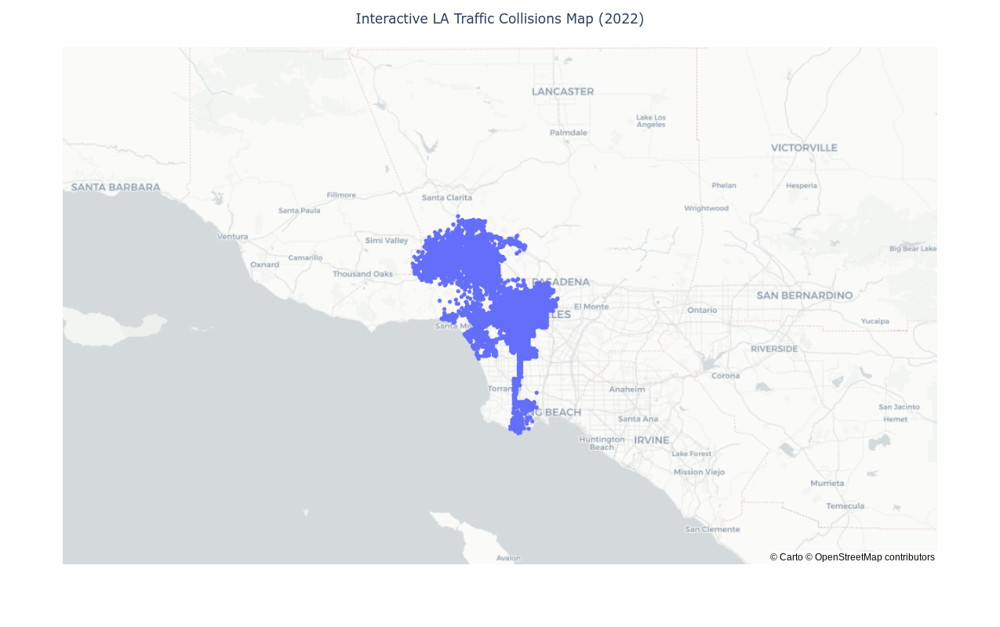

In [12]:
fig = px.scatter_mapbox(lastyear_collisions,
                        lat='latitude',
                        lon='longitude',
                        mapbox_style="carto-positron")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive LA Traffic Collisions Map (2022)",
    title_x=0.5 # aligns title to center
)

fig.show()

# Now let's map traffic collisions by race
mapping collisions by race is a good way to see the demographics of the accidents and seeing the patterns of where certain groups live and how they commute. In future steps, we can then mark where Vision Zero initiatives are being implemented and see if communities with high rates of collisions are being targeted or not.

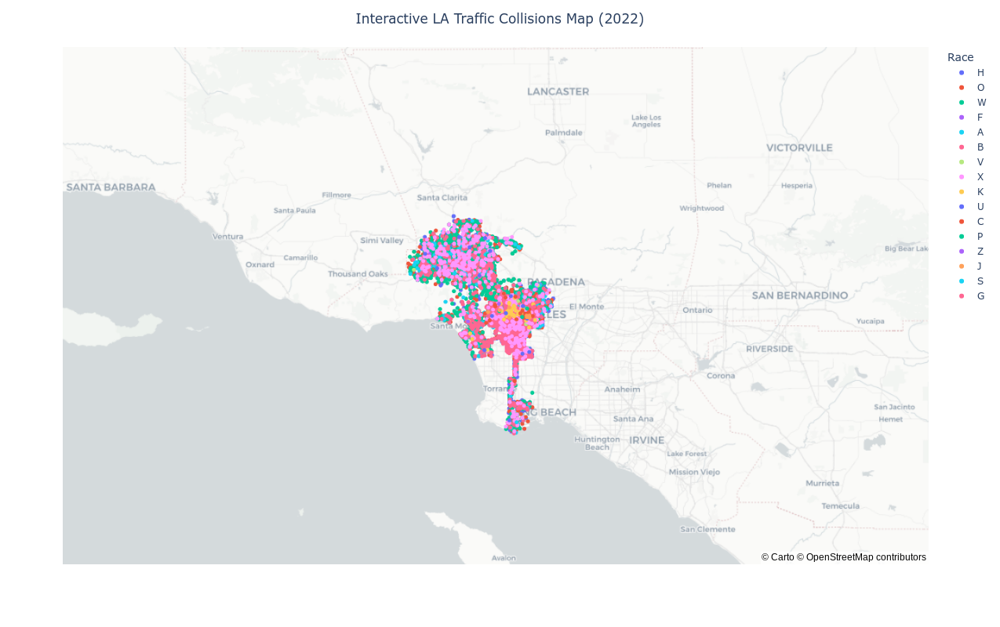

In [13]:
fig = px.scatter_mapbox(lastyear_collisions, 
                        lat="latitude", 
                        lon="longitude", 
                        color="vict_descent",
                        labels={'vict_descent':'Race'},
                        mapbox_style="carto-positron"
                       )

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive LA Traffic Collisions Map (2022)",
    title_x=0.5 # aligns title to center
)


fig.show()

# Race is as follows:
A - Other Asian 
B - Black 
C - Chinese 
D - Cambodian 
F - Filipino 
G - Guamanian 
H - Hispanic/Latin/Mexican 
I - American Indian/Alaskan Native 
J - Japanese 
K - Korean 
L - Laotian 
O - Other 
P - Pacific Islander 
S - Samoan 
U - Hawaiian 
V - Vietnamese 
W - White 
X - Unknown 
Z - Asian Indian

In [14]:
#Creating collision maps isolating by race
def race_map(race='H'):
    
    fig = px.scatter_mapbox(
                            lastyear_collisions[lastyear_collisions.vict_descent==race], 
                            lat="latitude", 
                            lon="longitude", 
                            color="vict_descent",
                            labels={'vict_descent':'Race'},
                            mapbox_style="carto-positron"
    )

    # options on the layout
    fig.update_layout(
        width = 600,
        height = 600,
        title = "Interactive LA Traffic Collisions Map (2022)<br>Showing where descent label is "+race,
        title_x=0.5 # aligns title to center
    )

    fig.show()

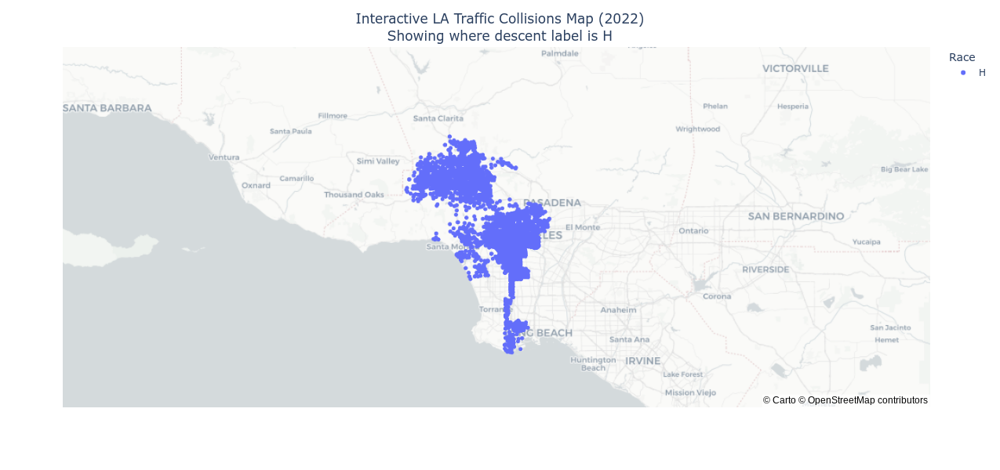

In [15]:
#showing collision map involving only those labeled as Hispanic/Latin/Mexican
race_map(race='H')

## getting rid of null values

In [16]:
# get a list of distinct race values
race_list = lastyear_collisions.vict_descent.unique().tolist()
race_list

['H',
 'O',
 'W',
 'F',
 nan,
 'A',
 'B',
 'V',
 'X',
 'K',
 'U',
 'C',
 'P',
 'Z',
 'J',
 'S',
 'G']

In [17]:
#dropping nan or null value
lastyear_collisions.dropna(inplace=True)

In [18]:
race_list = lastyear_collisions.vict_descent.unique().tolist()
race_list

['H', 'O', 'W', 'F', 'A', 'B', 'X', 'K', 'U', 'V', 'C', 'P', 'Z', 'J', 'G']

### Using a loop to see each race individually on the interactive map
By seeing each race individually, we can see where the accidents are happening to certain groups of people. From there, we can see if there are any discrepancies in those areas and if Vision Zero has done anything to improve those communities for traffic safety.

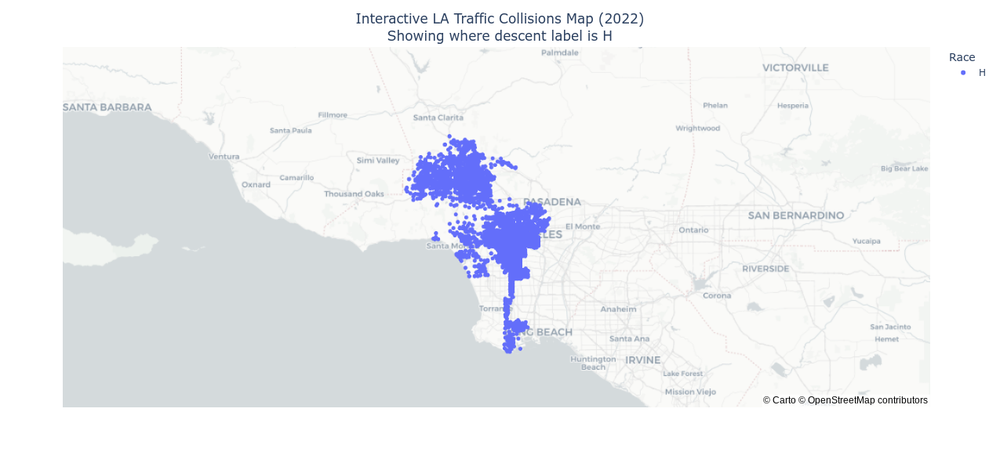

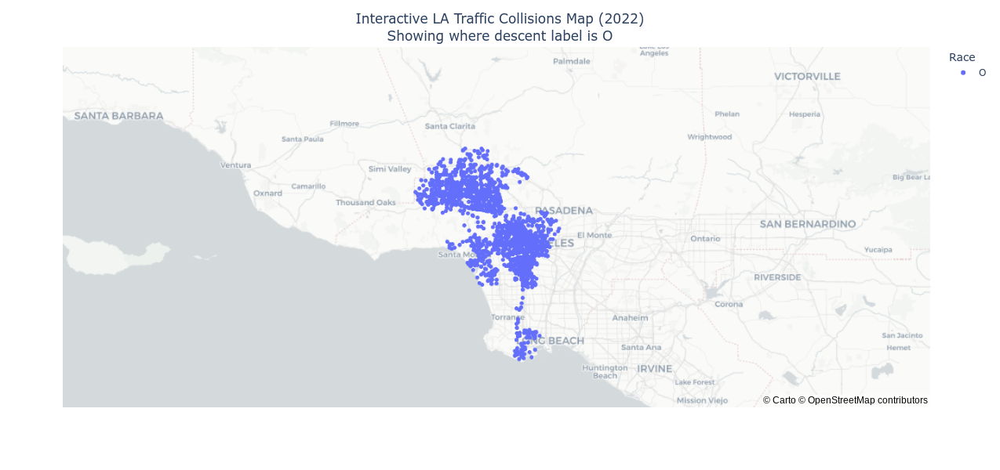

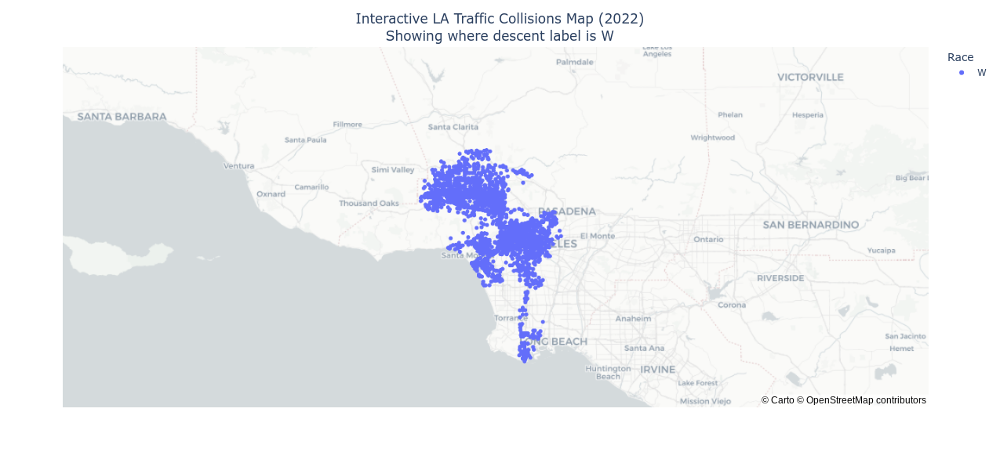

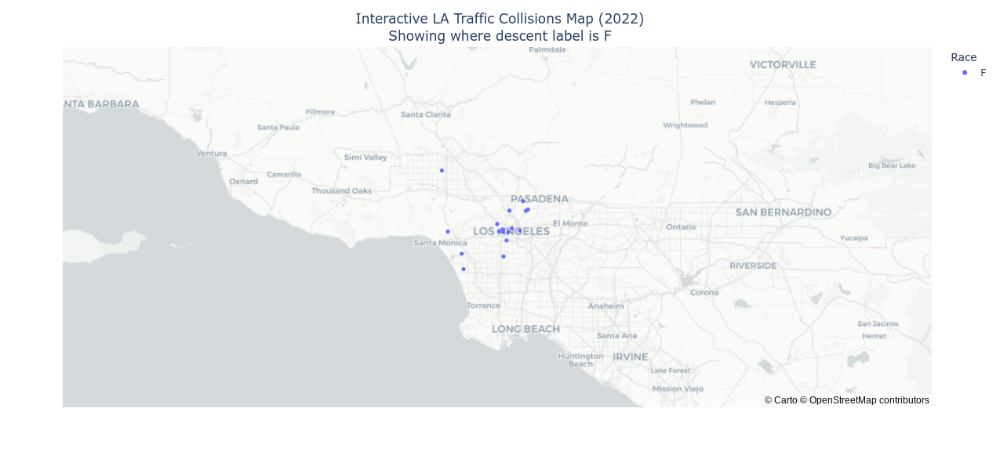

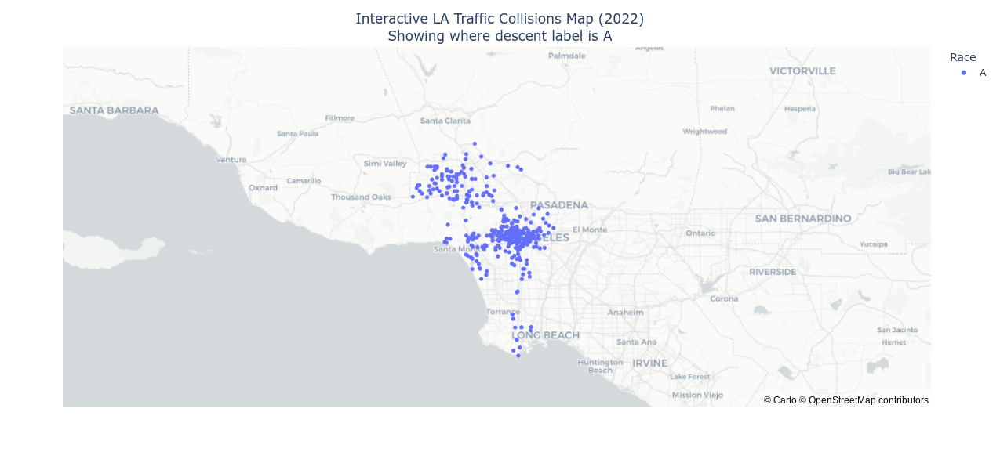

...

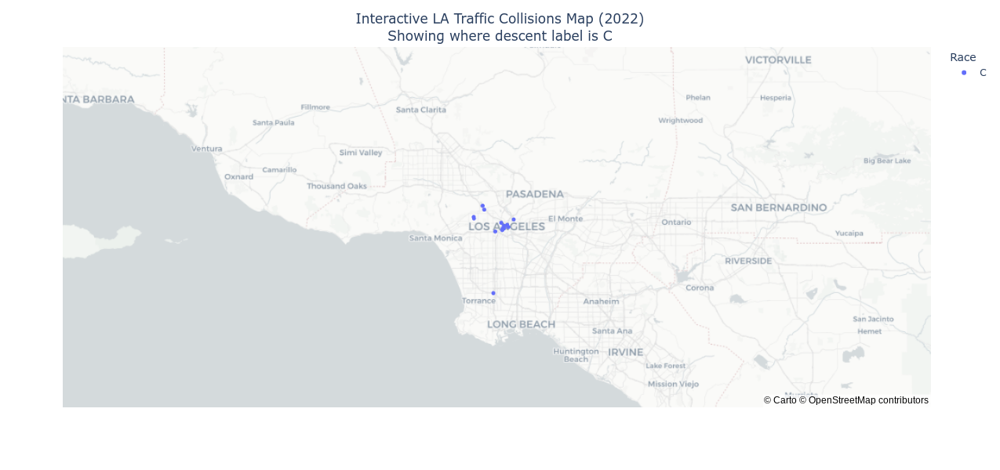

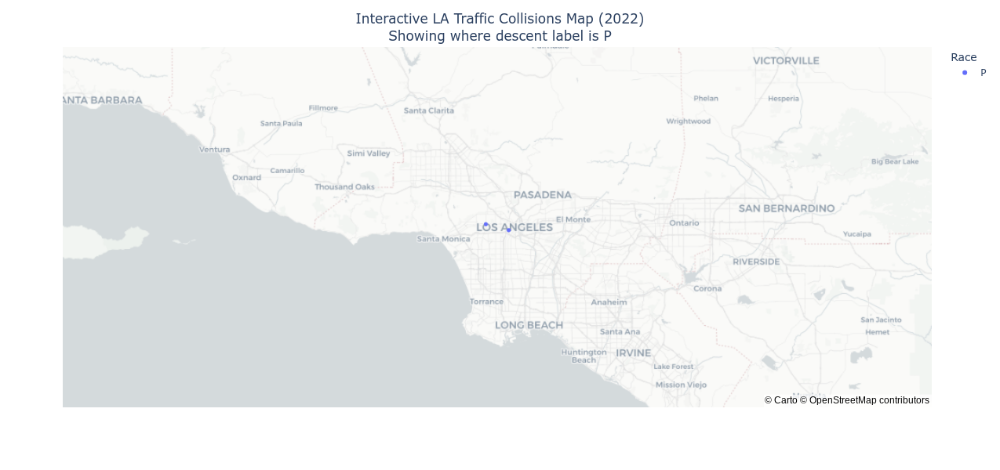

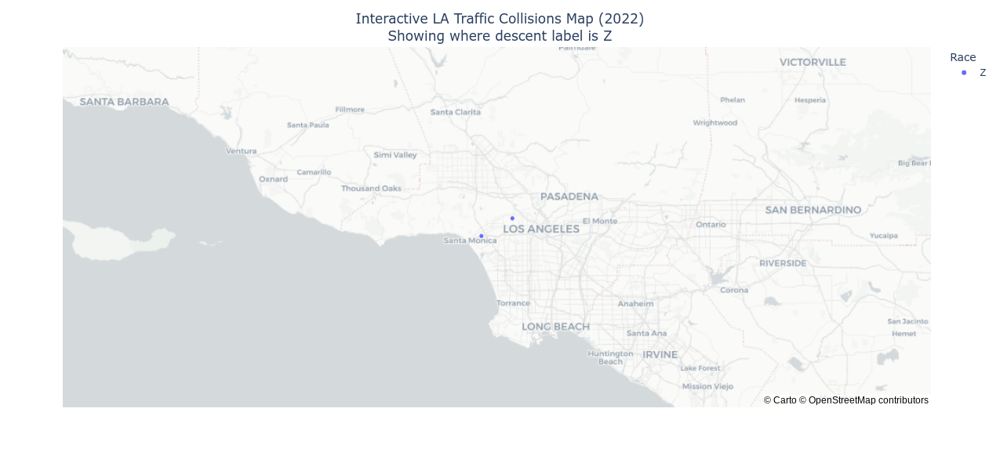

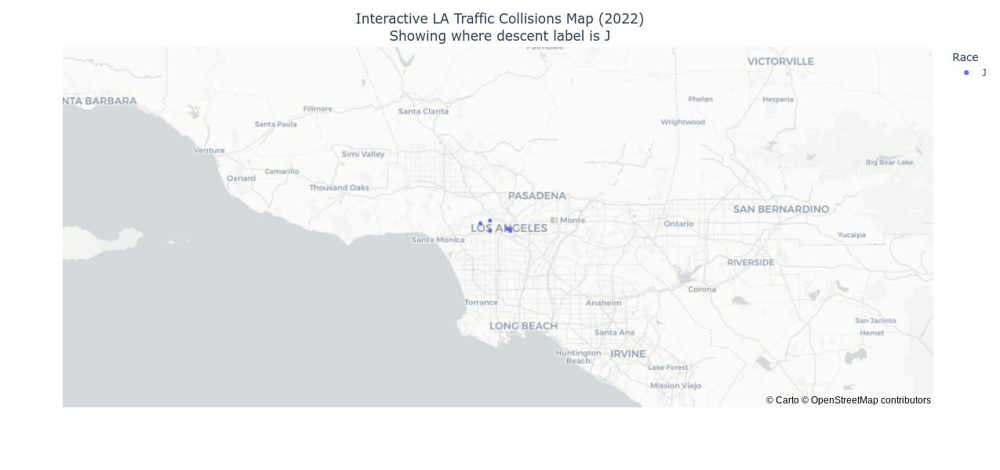

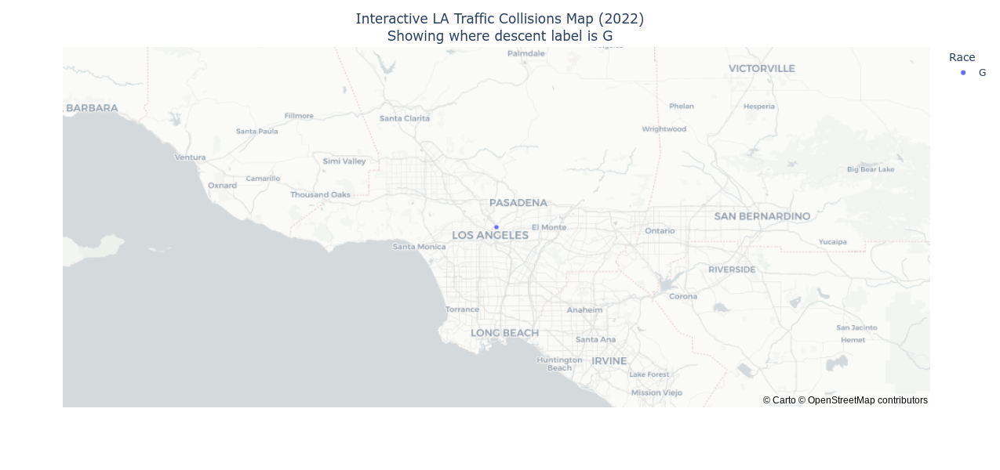

In [76]:
for race in race_list:
    race_map(race)

# Summarize by Neighborhood

In [19]:
import geopandas as gpd

In [20]:
neighborhoods = gpd.read_file("https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson")

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


<AxesSubplot: >

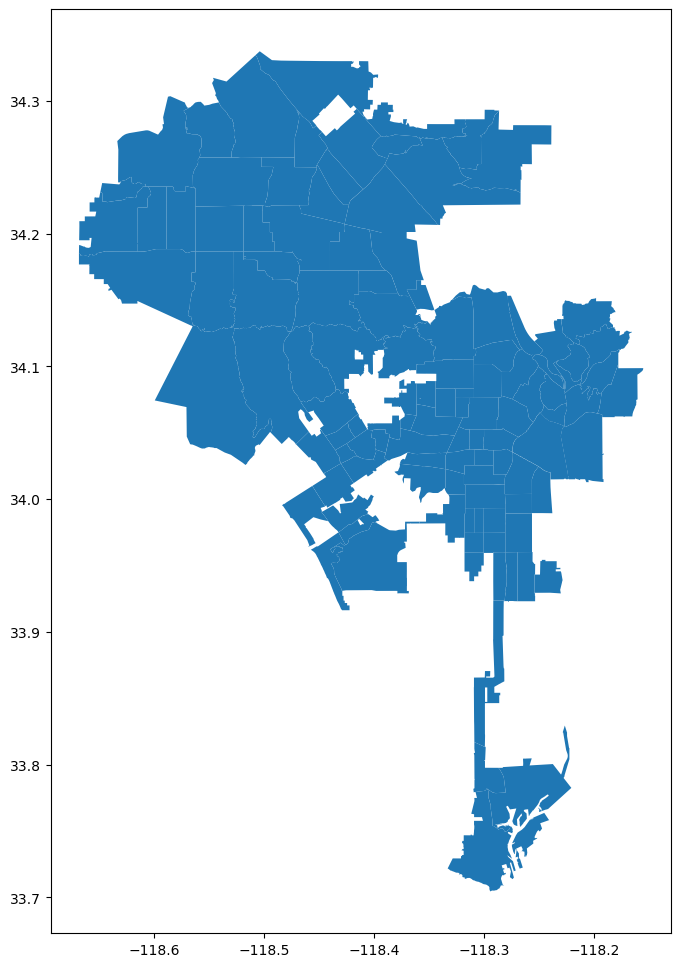

In [21]:
neighborhoods.plot(figsize=(12,12))

<AxesSubplot: >

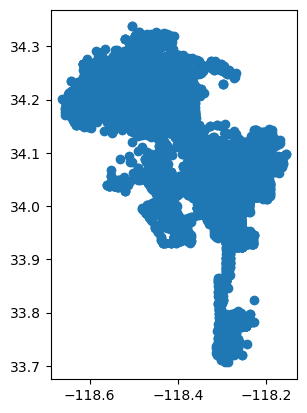

In [22]:
# convert lastyear_collisions to geodataframe
gdf = gpd.GeoDataFrame(
    lastyear_collisions, geometry=gpd.points_from_xy(lastyear_collisions.longitude, lastyear_collisions.latitude),crs=4326)

# check that it can be mapped
gdf.plot()

In [23]:
# conduct a spatial join (i.e. assign each collision to the neighborhood it is in)
collision_by_neighborhood = gpd.sjoin(neighborhoods, gdf) #Spatial join Points to polygons
collision_by_neighborhood

,OBJECTID,name,geometry,index_right,dr_no,date_rptd,date_occ,time_occ,area,area_name,...,vict_age,vict_sex,vict_descent,premis_cd,premis_desc,location,cross_street,location_1,latitude,longitude
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",3342,220307611,2022-03-17T00:00:00.000,2022-03-17T00:00:00.000,1230,03,Southwest,...,30,F,H,101,STREET,JEFFERSON BL,HOBART BL,"{'latitude': '34.0256', 'longitude': '-118.307...",34.0256,-118.3078
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",287,220304480,2022-01-12T00:00:00.000,2022-01-08T00:00:00.000,1900,03,Southwest,...,37,F,B,101,STREET,HOBART BL,JEFFERSON BL,"{'latitude': '34.0256', 'longitude': '-118.307...",34.0256,-118.3078
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",1415,220305437,2022-02-03T00:00:00.000,2022-02-03T00:00:00.000,1840,03,Southwest,...,63,M,H,101,STREET,JEFFERSON,HOBART,"{'latitude': '34.0256', 'longitude': '-118.307...",34.0256,-118.3078
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",4556,220309034,2022-04-13T00:00:00.000,2022-04-13T00:00:00.000,1815,03,Southwest,...,29,F,H,101,STREET,HARVARD,29TH,"{'latitude': '34.0291', 'longitude': '-118.306...",34.0291,-118.3067
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",9130,220314071,2022-07-22T00:00:00.000,2022-07-20T00:00:00.000,2303,03,Southwest,...,21,M,O,101,STREET,HALLDALE AV,29TH ST,"{'latitude': '34.0291', 'longitude': '-118.302...",34.0291,-118.3028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",5401,221008586,2022-04-30T00:00:00.000,2022-04-30T00:00:00.000,0930,10,West Valley,...,25,M,H,101,STREET,BURTON,ENCINO,"{'latitude': '34.2201', 'longitude': '-118.514...",34.2201,-118.5143
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",14212,221016437,2022-11-13T00:00:00.000,2022-11-13T00:00:00.000,0745,10,West Valley,...,50,M,O,101,STREET,BALBOA BL,BALBOA PL,"{'latitude': '34.2179', 'longitude': '-118.501...",34.2179,-118.5014
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",10487,221013002,2022-08-21T00:00:00.000,2022-08-20T00:00:00.000,2045,10,West Valley,...,67,F,W,101,STREET,BALBOA BL,BALBOA PL,"{'latitude': '34.2179', 'longitude': '-118.501...",34.2179,-118.5014
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",10291,221712335,2022-08-15T00:00:00.000,2022-08-15T00:00:00.000,1133,17,Devonshire,...,19,M,H,101,STREET,ROSCOE BL,LOUISE AV,"{'latitude': '34.2211', 'longitude': '-118.509...",34.2211,-118.5099


In [24]:
# count the number of records per community
collision_counts = collision_by_neighborhood.value_counts('name').reset_index(name='collision_counts')
collision_counts

,name,collision_counts
0,Downtown,811
1,Van Nuys,421
2,Hollywood,409
3,Westlake,391
4,Koreatown,345
...,...,...
109,Montecito Heights,14
110,Mount Washington,12
111,Rancho Park,10
112,Beverlywood,6


In [25]:
# add the count to the neighborhoods
neighborhoods = neighborhoods.merge(collision_counts, how='left', on='name')

In [26]:
neighborhoods.sample(10)

,OBJECTID,name,geometry,collision_counts
4,5,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0...",105
110,111,Windsor Square,"POLYGON ((-118.31404 34.06254, -118.31420 34.0...",25
78,79,Reseda,"POLYGON ((-118.55822 34.18657, -118.56223 34.1...",236
95,96,Valley Village,"POLYGON ((-118.37928 34.15687, -118.37769 34.1...",49
35,36,Gramercy Park,"POLYGON ((-118.30041 33.95002, -118.30073 33.9...",66
24,25,Eagle Rock,"POLYGON ((-118.19820 34.15160, -118.19821 34.1...",44
99,100,Vermont-Slauson,"POLYGON ((-118.28061 33.99330, -118.28061 33.9...",226
90,91,Tarzana,"POLYGON ((-118.52729 34.17083, -118.52724 34.1...",110
60,61,Mid-City,"MULTIPOLYGON (((-118.36860 34.03497, -118.3685...",212
59,60,Mar Vista,"POLYGON ((-118.42142 34.01033, -118.42010 34.0...",49


In [28]:
#renaming columns
collision_counts = collision_counts.rename(columns={'name': 'LA Neighborhood', 'collision_counts': 'Number of Collisions'})

# Bar Chart with Top 10 Neighborhoods with the highest number of collisions
this data is useful to clearly see the staggering amount of collisions in Downtown LA. We can use this information to narrow down our focus to analyzing the Downtown area and see if there has been efforts from Vision Zero to reduce collisions.

<AxesSubplot: xlabel='LA Neighborhood'>

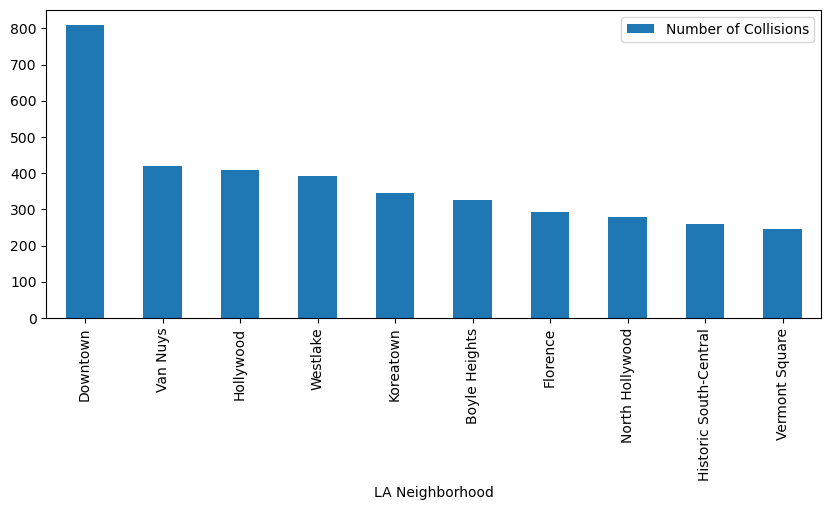

In [29]:
#do a bar chart to see neighborhoods with most accidents
collision_counts[:10].plot.bar(figsize=(10,4),
                             x='LA Neighborhood', 
                             y='Number of Collisions')

### Next Steps
I want to compare 2015 collision data to 2022 collision data and see if there has been an increase or decrease in collisions.

In [48]:
#only look at 2015 collision data
initial_year_results = client.get("d5tf-ez2w", 
                     limit = 60000, # putting an arbitrary high number (otherwise defaults to 1000)
                     where = "date_occ between '2015-01-01T00:00:00' and '2015-12-31T00:00:00'"
                    )

In [49]:
# Convert to pandas DataFrame
initial_year_results = pd.DataFrame.from_records(initial_year_results)

In [50]:
# how many rows and columns?
initial_year_results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52488 entries, 0 to 52487
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   dr_no         52488 non-null  object
 1   date_rptd     52488 non-null  object
 2   date_occ      52488 non-null  object
 3   time_occ      52488 non-null  object
 4   area          52488 non-null  object
 5   area_name     52488 non-null  object
 6   rpt_dist_no   52488 non-null  object
 7   crm_cd        52488 non-null  object
 8   crm_cd_desc   52488 non-null  object
 9   mocodes       51549 non-null  object
 10  vict_sex      50994 non-null  object
 11  vict_descent  50932 non-null  object
 12  premis_cd     52487 non-null  object
 13  premis_desc   52487 non-null  object
 14  location      52488 non-null  object
 15  cross_street  50764 non-null  object
 16  location_1    52488 non-null  object
 17  vict_age      43067 non-null  object
dtypes: object(18)
memory usage: 7.2+ MB


In [51]:
# create latitudue/longitude columns
initial_year_results['latitude'] = pd.json_normalize(initial_year_results['location_1'])['latitude']
initial_year_results['longitude'] = pd.json_normalize(initial_year_results['location_1'])['longitude']

# convert to floats
initial_year_results['latitude'] = initial_year_results['latitude'].astype('float')
initial_year_results['longitude'] = initial_year_results['longitude'].astype('float')

In [52]:
initial_year_results.tail(5)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,mocodes,vict_sex,vict_descent,premis_cd,premis_desc,location,cross_street,location_1,vict_age,latitude,longitude
52483,162004218,2015-12-31T00:00:00.000,2015-12-31T00:00:00.000,2030,20,Olympic,2076,997,TRAFFIC COLLISION,3004 3028 3030 3035 3037 3101 3401 3701 4020,M,K,101,STREET,VERMONT AV,VENICE BL,"{'latitude': '34.0443', 'longitude': '-118.291...",55,34.0443,-118.2916
52484,162004058,2016-01-02T00:00:00.000,2015-12-31T00:00:00.000,1930,20,Olympic,2014,997,TRAFFIC COLLISION,3006 3028 3030 3035 3037 3101 3401 3701 4027,F,W,101,STREET,KINGSLEY DR,3RD ST,"{'latitude': '34.069', 'longitude': '-118.3029...",27,34.0690,-118.3029
52485,162004219,2015-12-31T00:00:00.000,2015-12-31T00:00:00.000,1800,20,Olympic,2013,997,TRAFFIC COLLISION,3006 3028 3030 3035 3036 3101 3401 3701 4020,F,K,101,STREET,WESTERN AV,1ST ST,"{'latitude': '34.0731', 'longitude': '-118.309...",47,34.0731,-118.3091
52486,162104010,2016-01-01T00:00:00.000,2015-12-31T00:00:00.000,1855,21,Topanga,2187,997,TRAFFIC COLLISION,3006 3037 3030 3028 3101 3401 3701 4021,F,W,101,STREET,VENTURA BL,DON PIO AV,"{'latitude': '34.1685', 'longitude': '-118.605...",53,34.1685,-118.6058
52487,162104142,2015-12-31T00:00:00.000,2015-12-31T00:00:00.000,1740,21,Topanga,2185,997,TRAFFIC COLLISION,3030 3037 3028 3101 3401 3701 4021 3006 3032,M,O,101,STREET,TOPANGA CANYON BL,DUMETZ RD,"{'latitude': '34.1569', 'longitude': '-118.605...",44,34.1569,-118.6058


### Interactive 2015 Collision by Race Map
We can see just from the density of the points on this map that there is a lot more collisions in 2015 compared to our 2022 data.

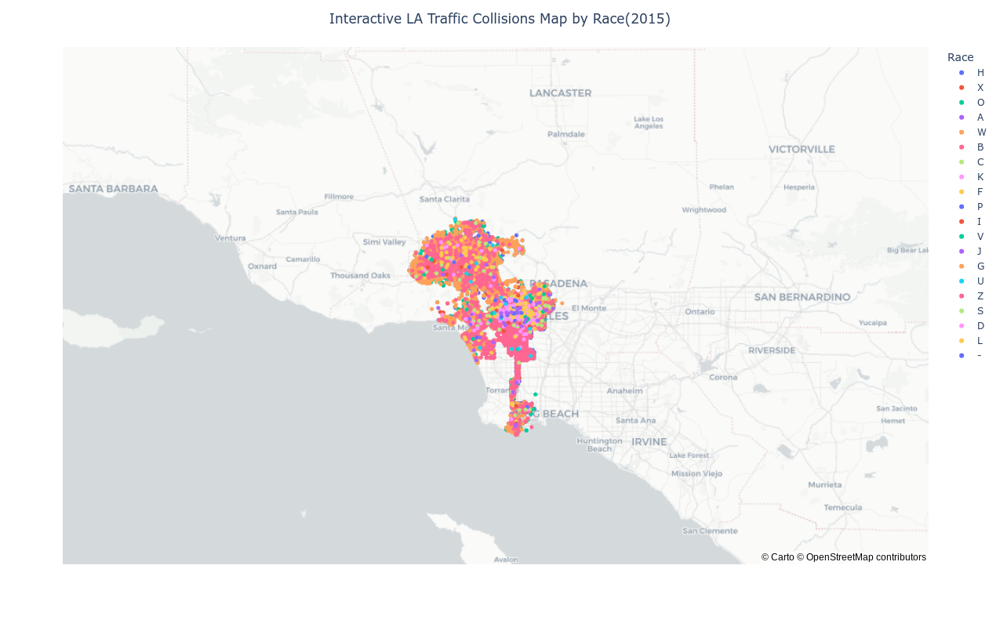

In [53]:
fig = px.scatter_mapbox(initial_year_results, 
                        lat="latitude", 
                        lon="longitude", 
                        color="vict_descent",
                        labels={'vict_descent':'Race'},
                        mapbox_style="carto-positron"
                       )

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive LA Traffic Collisions Map by Race(2015)",
    title_x=0.5 # aligns title to center
)


fig.show()

### get rid of null values

In [67]:
# get a list of distinct race values
race_list_two = initial_year_results.vict_descent.unique().tolist()
race_list_two

['H',
 'X',
 'O',
 'A',
 'W',
 nan,
 'B',
 'C',
 'K',
 'F',
 'P',
 'I',
 'V',
 'J',
 'G',
 'U',
 'Z',
 'S',
 'D',
 'L',
 '-']

In [68]:
#dropping nan or null value
initial_year_results.dropna(inplace=True)

#show updated race list
race_list_two = initial_year_results.vict_descent.unique().tolist()
race_list_two

['O',
 'H',
 'A',
 'W',
 'B',
 'C',
 'X',
 'K',
 'F',
 'P',
 'I',
 'V',
 'J',
 'G',
 'U',
 'Z',
 'S',
 'D',
 'L']

### now lets summarize by neighborhood

<AxesSubplot: >

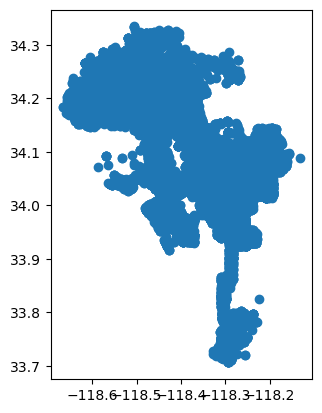

In [69]:
# convert initial_year_results to geodataframe
gdf_two = gpd.GeoDataFrame(
    initial_year_results, geometry=gpd.points_from_xy(initial_year_results.longitude, initial_year_results.latitude),crs=4326)

# check that it can be mapped
gdf_two.plot()

In [70]:
# conduct a spatial join (i.e. assign each collision to the neighborhood it is in)
collision_by_neighborhood_two = gpd.sjoin(neighborhoods, gdf_two) #Spatial join Points to polygons
collision_by_neighborhood_two

,OBJECTID,name,geometry,collision_counts,index_right,dr_no,date_rptd,date_occ,time_occ,area,...,vict_sex,vict_descent,premis_cd,premis_desc,location,cross_street,location_1,vict_age,latitude,longitude
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",40,49293,150326348,2015-12-11T00:00:00.000,2015-12-10T00:00:00.000,2215,03,...,M,B,101,STREET,VERMONT AV,25TH ST,"{'latitude': '34.0307', 'longitude': '-118.292...",56,34.0307,-118.2923
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",40,41591,150322938,2015-10-20T00:00:00.000,2015-10-20T00:00:00.000,0815,03,...,M,W,101,STREET,VERMONT AV,30TH ST,"{'latitude': '34.0307', 'longitude': '-118.292...",37,34.0307,-118.2923
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",40,29916,150318622,2015-08-20T00:00:00.000,2015-08-04T00:00:00.000,1750,03,...,F,W,101,STREET,LA CIENEGA BL,RODEO RD,"{'latitude': '34.0307', 'longitude': '-118.292...",71,34.0307,-118.2923
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",40,10479,150308760,2015-03-19T00:00:00.000,2015-03-18T00:00:00.000,0800,03,...,F,H,101,STREET,CATALINA,30TH,"{'latitude': '34.0272', 'longitude': '-118.293...",41,34.0272,-118.2937
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",40,34018,150319482,2015-09-01T00:00:00.000,2015-08-31T00:00:00.000,2125,03,...,F,H,101,STREET,BUDLONG AV,29TH ST,"{'latitude': '34.0287', 'longitude': '-118.295...",25,34.0287,-118.2959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",87,52138,151019288,2015-12-29T00:00:00.000,2015-12-29T00:00:00.000,1640,10,...,F,H,101,STREET,ROSCOE BL,LOUISE AV,"{'latitude': '34.2211', 'longitude': '-118.509...",63,34.2211,-118.5099
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",87,47973,151018149,2015-12-01T00:00:00.000,2015-12-01T00:00:00.000,1650,10,...,F,H,101,STREET,ROSCOE BL,LOUISE AV,"{'latitude': '34.2211', 'longitude': '-118.509...",44,34.2211,-118.5099
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",87,9853,151707385,2015-03-13T00:00:00.000,2015-03-13T00:00:00.000,2135,17,...,M,O,101,STREET,ROSCOE BL,LOUISE AV,"{'latitude': '34.2211', 'longitude': '-118.509...",60,34.2211,-118.5099
113,114,Lake Balboa,"POLYGON ((-118.50116 34.22114, -118.50116 34.2...",87,46398,151017771,2015-11-20T00:00:00.000,2015-11-20T00:00:00.000,1145,10,...,F,H,101,STREET,ROSCOE BL,LOUISE AV,"{'latitude': '34.2211', 'longitude': '-118.509...",50,34.2211,-118.5099


In [56]:
# count the number of records per community
collision_counts_two = collision_by_neighborhood_two.value_counts('name').reset_index(name='collision_counts')
collision_counts_two

,name,collision_counts
0,Downtown,2334
1,Van Nuys,1683
2,Hollywood,1649
3,Koreatown,1546
4,Westlake,1263
...,...,...
109,Elysian Valley,64
110,Cheviot Hills,62
111,Beverlywood,34
112,Hansen Dam,23


In [71]:
# add the count to the neighborhoods
neighborhoods_two = neighborhoods.merge(collision_counts_two, how='left', on='name')

In [72]:
neighborhoods_two.sample(10)

,OBJECTID,name,geometry,collision_counts_x,collision_counts_y
11,12,Broadway-Manchester,"POLYGON ((-118.26954 33.92919, -118.26956 33.9...",126,342
9,10,Boyle Heights,"POLYGON ((-118.19263 34.06077, -118.19260 34.0...",327,1080
7,8,Beverly Grove,"POLYGON ((-118.37251 34.09026, -118.37250 34.0...",111,454
56,57,Lincoln Heights,"POLYGON ((-118.21218 34.08389, -118.21194 34.0...",107,377
32,33,Fairfax,"POLYGON ((-118.34563 34.06889, -118.34615 34.0...",78,394
15,16,Century City,"POLYGON ((-118.41267 34.06073, -118.41222 34.0...",18,103
106,107,Westlake,"POLYGON ((-118.25908 34.05389, -118.25984 34.0...",391,1263
36,37,Granada Hills,"POLYGON ((-118.48954 34.31469, -118.48576 34.3...",120,481
3,4,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788...",27,162
97,98,Venice,"MULTIPOLYGON (((-118.45619 33.96247, -118.4573...",150,670


In [74]:
#renaming columns
collision_counts_two = collision_counts_two.rename(columns={'name': 'LA Neighborhood', 'collision_counts': 'Number of Collisions'})

<AxesSubplot: xlabel='LA Neighborhood'>

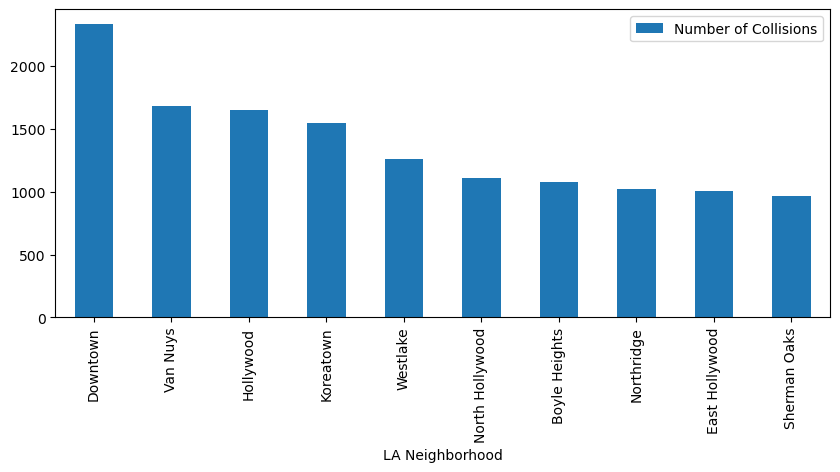

In [75]:
#do a bar chart to see neighborhoods with most accidents
collision_counts_two[:10].plot.bar(figsize=(10,4),
                             x='LA Neighborhood', 
                             y='Number of Collisions')

### Interpreting 2015 vs 2022 data
We can see that traffic collisions have decreased dramatically from the highest rate of collisions at 2334 in 2015 to 811 collisions in 2022. We can also see that the top 10 nieghborhoods with the highest collisions have changed slightly as well. The top 3 neighborhoods has remained the same, while Koreatown and Westlake and swapped 4th and 5th place and 6th-10th place spots have changed more dramatically, with neighborhoods like Northride, East Hollywood, and Sherman Oaks falling off the list entirely in 2022. This is useful for our analysis in many ways. As we move forward, we can look in the areas that have dropped off the top 10 list and see if Vision Zero initiatives have been utilized to reduce traffic collisions. We can also look at the top 3 neighborhoods and see what has changed to make the collisions drop so dramatically. 